In [1]:
import os
import csv
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler

def read_data(folder_path, expected_duration):
    csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')][:100]  # Wybieramy tylko 100 plików
    num_elements = int(expected_duration * 100)
    
    file_info = [] 
    
    ACCX = pd.DataFrame()
    ACCY = pd.DataFrame()
    ACCZ = pd.DataFrame()

    GYROX = pd.DataFrame()
    GYROY = pd.DataFrame()
    GYROZ = pd.DataFrame()

    EOGL = pd.DataFrame()
    EOGR = pd.DataFrame()
    EOGH = pd.DataFrame()
    EOGV = pd.DataFrame()

    for csv_file in csv_files:
        with open(os.path.join(folder_path, csv_file), 'r') as f:
            reader = csv.reader(f)
            data = list(reader)[6:]
           

        df = pd.DataFrame(data, columns=["Artifact", "Num", "Date", "ACC_X", "ACC_Y", "ACC_Z", "GYRO_X", "GYRO_Y", "GYRO_Z", "EOG_L", "EOG_R", "EOG_H", "EOG_V"])

        acc_x = df['ACC_X'].astype(int)[:num_elements]
        acc_y = df['ACC_Y'].astype(int)[:num_elements]
        acc_z = df['ACC_Z'].astype(int)[:num_elements]

        gyro_x = df['GYRO_X'].astype(int)[:num_elements]
        gyro_y = df['GYRO_Y'].astype(int)[:num_elements]
        gyro_z = df['GYRO_Z'].astype(int)[:num_elements]

        eog_l = df['EOG_L'].astype(int)[:num_elements]
        eog_r = df['EOG_R'].astype(int)[:num_elements]
        eog_h = df['EOG_H'].astype(int)[:num_elements]
        eog_v = df['EOG_V'].astype(int)[:num_elements]

        ACCX = pd.concat([ACCX, acc_x], ignore_index=True, axis=1)
        ACCY = pd.concat([ACCY, acc_y], ignore_index=True, axis=1)
        ACCZ = pd.concat([ACCZ, acc_z], ignore_index=True, axis=1)

        GYROX = pd.concat([GYROX, gyro_x], ignore_index=True, axis=1)
        GYROY = pd.concat([GYROY, gyro_y], ignore_index=True, axis=1)
        GYROZ = pd.concat([GYROZ, gyro_z], ignore_index=True, axis=1)

        EOGL = pd.concat([EOGL, eog_l], ignore_index=True, axis=1)
        EOGR = pd.concat([EOGR, eog_r], ignore_index=True, axis=1)
        EOGH = pd.concat([EOGH, eog_h], ignore_index=True, axis=1)
        EOGV = pd.concat([EOGV, eog_v], ignore_index=True, axis=1)
        
        file_info.append({'file_name': csv_file})  
    
    return ACCX, ACCY, ACCZ, GYROX, GYROY, GYROZ, EOGL, EOGR, EOGH, EOGV, file_info



In [2]:
# ZADANIE 1
# DLA POMIARÓW ODNIESIENIA
folder_path_reference = '/Users/juliamieszczanin/Desktop/PP/Wyjazd_z_stacji_odniesienie'
expected_duration = 10


ACCX_reference, ACCY_reference, ACCZ_reference, GYROX_reference, GYROY_reference, GYROZ_reference, EOGL_reference, EOGR_reference, EOGH_reference, EOGV_reference, file_info_reference = read_data(folder_path_reference , expected_duration)


In [3]:
# DLA POMIARÓW Z WYKORZYSTANIEM ALKOGOGLI
folder_path_alcogogle = '/Users/juliamieszczanin/Desktop/PP/PP_Wyjazd_z_stacji_Alkogogle'
expected_duration = 10


ACCX_alcogogle, ACCY_alcogogle, ACCZ_alcogogle, GYROX_alcogogle, GYROY_alcogogle, GYROZ_alcogogle, EOGL_alcogogle, EOGR_alcogogle, EOGH_alcogogle, EOGV_alcogogle, file_info_alcogogle = read_data(folder_path_alcogogle , expected_duration)



In [4]:
# DLA POMIARÓW Z WYKORZYSTANIEM GLUKOZY 
folder_path_glucose = '/Users/juliamieszczanin/Desktop/PP/Glukoza_wyjazd'
expected_duration = 10


ACCX_glucose, ACCY_glucose, ACCZ_glucose, GYROX_glucose, GYROY_glucose, GYROZ_glucose, EOGL_glucose, EOGR_glucose, EOGH_glucose, EOGV_glucose, file_info_glucose = read_data(folder_path_glucose , expected_duration)


In [5]:
# DLA POMIARÓW Z WYKORZYSTANIEM TELEFONU
folder_path_phone = '/Users/juliamieszczanin/Desktop/PP/PP_Wyjazd_z_stacji_telefon'
expected_duration = 10


ACCX_phone, ACCY_phone, ACCZ_phone, GYROX_phone, GYROY_phone, GYROZ_phone, EOGL_phone, EOGR_phone, EOGH_phone, EOGV_phone, file_info_phone = read_data(folder_path_phone , expected_duration)


In [6]:
# DLA POMIARÓW Z WYKORZYSTANIEM NAPOJU
folder_path_water = '/Users/juliamieszczanin/Desktop/PP/PP_Wyjazd_z_stacji_picie'
expected_duration = 10


ACCX_water, ACCY_water, ACCZ_water, GYROX_water, GYROY_water, GYROZ_water, EOGL_water, EOGR_water, EOGH_water, EOGV_water, file_info_water = read_data(folder_path_water , expected_duration)


In [7]:
## Normalizacja danych 
def normalize_data(ACCX, ACCY, ACCZ, GYROX, GYROY, GYROZ, EOGL, EOGR, EOGH, EOGV):
    
    # Normalizacja
    scaler = MinMaxScaler()
    normalized_ACCX = pd.DataFrame(scaler.fit_transform(ACCX), columns=ACCX.columns)
    normalized_ACCY = pd.DataFrame(scaler.fit_transform(ACCY), columns=ACCY.columns)
    normalized_ACCZ = pd.DataFrame(scaler.fit_transform(ACCZ), columns=ACCZ.columns)
    
    normalized_GYROX = pd.DataFrame(scaler.fit_transform(GYROX), columns=GYROX.columns)
    normalized_GYROY = pd.DataFrame(scaler.fit_transform(GYROY), columns=GYROY.columns)
    normalized_GYROZ = pd.DataFrame(scaler.fit_transform(GYROZ), columns=GYROZ.columns)
    
    normalized_EOGL = pd.DataFrame(scaler.fit_transform(EOGL), columns=EOGL.columns)
    normalized_EOGR = pd.DataFrame(scaler.fit_transform(EOGR), columns=EOGR.columns)
    normalized_EOGH = pd.DataFrame(scaler.fit_transform(EOGH), columns=EOGH.columns)
    normalized_EOGV = pd.DataFrame(scaler.fit_transform(EOGV), columns=EOGV.columns)
    
    return normalized_ACCX, normalized_ACCY, normalized_ACCZ, normalized_GYROX,normalized_GYROY, normalized_GYROZ, normalized_EOGL, normalized_EOGR, normalized_EOGH, normalized_EOGV

def standardize_data(ACCX, ACCY, ACCZ, GYROX, GYROY, GYROZ, EOGL, EOGR, EOGH, EOGV):
    # Standaryzacja
    scaler = StandardScaler()    
    standardized_ACCX = pd.DataFrame(scaler.fit_transform(ACCX), columns=ACCX.columns)
    standardized_ACCY = pd.DataFrame(scaler.fit_transform(ACCY), columns=ACCY.columns)
    standardized_ACCZ = pd.DataFrame(scaler.fit_transform(ACCZ), columns=ACCZ.columns)
    
    standardized_GYROX = pd.DataFrame(scaler.fit_transform(GYROX), columns=GYROX.columns)
    standardized_GYROY = pd.DataFrame(scaler.fit_transform(GYROY), columns=GYROY.columns)
    standardized_GYROZ = pd.DataFrame(scaler.fit_transform(GYROZ), columns=GYROZ.columns)
    
    standardized_EOGL = pd.DataFrame(scaler.fit_transform(EOGL), columns=EOGL.columns)
    standardized_EOGR = pd.DataFrame(scaler.fit_transform(EOGR), columns=EOGR.columns)
    standardized_EOGH = pd.DataFrame(scaler.fit_transform(EOGH), columns=EOGH.columns)
    standardized_EOGV = pd.DataFrame(scaler.fit_transform(EOGV), columns=EOGV.columns)

    return standardized_ACCX, standardized_ACCY, standardized_ACCZ, standardized_GYROX,standardized_GYROY, standardized_GYROZ, standardized_EOGL, standardized_EOGR, standardized_EOGH, standardized_EOGV

In [25]:
# ZADANIE 2
# NORMALIZACJA DLA POMIARÓW ODNIESIENIA
ACCX_normalized_reference, ACCY_normalized_reference, ACCZ_normalized_reference, GYROX_normalized_reference, GYROY_normalized_reference, GYROZ_normalized_reference, EOGL_normalized_reference, EOGR_normalized_reference, EOGH_normalized_reference, EOGV_normalized_reference = normalize_data(ACCX_reference, ACCY_reference, ACCZ_reference, GYROX_reference, GYROY_reference, GYROZ_reference, EOGL_reference, EOGR_reference, EOGH_reference, EOGV_reference)
# STANDARYZACJA DLA POMIARÓW ODNIESIENIA
ACCX_standardized_reference, ACCY_standardized_reference, ACCZ_standardized_reference, GYROX_standardized_reference, GYROY_standardized_reference, GYROZ_standardized_reference, EOGL_standardized_reference, EOGR_standardized_reference, EOGH_standardized_reference, EOGV_standardized_reference = standardize_data(ACCX_normalized_reference, ACCY_normalized_reference, ACCZ_normalized_reference, GYROX_normalized_reference, GYROY_normalized_reference, GYROZ_normalized_reference, EOGL_normalized_reference, EOGR_normalized_reference, EOGH_normalized_reference, EOGV_normalized_reference)

In [26]:
# NORMALIZACJA DLA POMIARÓW Z WYKORZYSTANIEM ALKOGOGLI
ACCX_normalized_alcogogle, ACCY_normalized_alcogogle, ACCZ_normalized_alcogogle, GYROX_normalized_alcogogle, GYROY_normalized_alcogogle, GYROZ_normalized_alcogogle, EOGL_normalized_alcogogle, EOGR_normalized_alcogogle, EOGH_normalized_alcogogle, EOGV_normalized_alcogogle = normalize_data(ACCX_alcogogle, ACCY_alcogogle, ACCZ_alcogogle, GYROX_alcogogle, GYROY_alcogogle, GYROZ_alcogogle, EOGL_alcogogle, EOGR_alcogogle, EOGH_alcogogle, EOGV_alcogogle)
# STANDARYZACJA DLA POMIARÓW Z WYKORZYSTANIEM ALKOGOGLI
ACCX_standardized_alcogogle, ACCY_standardized_alcogogle, ACCZ_standardized_alcogogle, GYROX_standardized_alcogogle, GYROY_standardized_alcogogle, GYROZ_standardized_alcogogle, EOGL_standardized_alcogogle, EOGR_standardized_alcogogle, EOGH_standardized_alcogogle, EOGV_standardized_alcogogle = standardize_data(ACCX_normalized_alcogogle, ACCY_normalized_alcogogle, ACCZ_normalized_alcogogle, GYROX_normalized_alcogogle, GYROY_normalized_alcogogle, GYROZ_normalized_alcogogle, EOGL_normalized_alcogogle, EOGR_normalized_alcogogle, EOGH_normalized_alcogogle, EOGV_normalized_alcogogle)

In [27]:
# NORMALIZACJA DLA POMIARÓW Z WYKORZYSTANIEM GLUKOZY 
ACCX_normalized_glucose, ACCY_normalized_glucose, ACCZ_normalized_glucose, GYROX_normalized_glucose, GYROY_normalized_glucose, GYROZ_normalized_glucose, EOGL_normalized_glucose, EOGR_normalized_glucose, EOGH_normalized_glucose, EOGV_normalized_glucose = normalize_data(ACCX_glucose, ACCY_glucose, ACCZ_glucose, GYROX_glucose, GYROY_glucose, GYROZ_glucose, EOGL_glucose, EOGR_glucose, EOGH_glucose, EOGV_glucose)
# STANDARYZACJA DLA POMIARÓW Z WYKORZYSTANIEM GLUKOZY 
ACCX_standardized_glucose, ACCY_standardized_glucose, ACCZ_standardized_glucose, GYROX_standardized_glucose, GYROY_standardized_glucose, GYROZ_standardized_glucose, EOGL_standardized_glucose, EOGR_standardized_glucose, EOGH_standardized_glucose, EOGV_standardized_glucose = standardize_data(ACCX_normalized_glucose, ACCY_normalized_glucose, ACCZ_normalized_glucose, GYROX_normalized_glucose, GYROY_normalized_glucose, GYROZ_normalized_glucose, EOGL_normalized_glucose, EOGR_normalized_glucose, EOGH_normalized_glucose, EOGV_normalized_glucose)

In [11]:
# NORMALIZACJA DLA POMIARÓW Z WYKORZYSTANIEM TELEFONU
ACCX_normalized_phone, ACCY_normalized_phone, ACCZ_normalized_phone, GYROX_normalized_phone, GYROY_normalized_phone, GYROZ_normalized_phone, EOGL_normalized_phone, EOGR_normalized_phone, EOGH_normalized_phone, EOGV_normalized_phone = normalize_data(ACCX_phone, ACCY_phone, ACCZ_phone, GYROX_phone, GYROY_phone, GYROZ_phone, EOGL_phone, EOGR_phone, EOGH_phone, EOGV_phone)
# STANDARYZACJA DLA POMIARÓW Z WYKORZYSTANIEM TELEFONU
ACCX_standardized_phone, ACCY_standardized_phone, ACCZ_standardized_phone, GYROX_standardized_phone, GYROY_standardized_phone, GYROZ_standardized_phone, EOGL_standardized_phone, EOGR_standardized_phone, EOGH_standardized_phone, EOGV_standardized_phone = standardize_data(ACCX_normalized_phone, ACCY_normalized_phone, ACCZ_normalized_phone, GYROX_normalized_phone, GYROY_normalized_phone, GYROZ_normalized_phone, EOGL_normalized_phone, EOGR_normalized_phone, EOGH_normalized_phone, EOGV_normalized_phone)

In [28]:
# NORMALIZACJA DLA POMIARÓW Z WYKORZYSTANIEM NAPOJU
ACCX_normalized_water, ACCY_normalized_water, ACCZ_normalized_water, GYROX_normalized_water, GYROY_normalized_water, GYROZ_normalized_water, EOGL_normalized_water, EOGR_normalized_water, EOGH_normalized_water, EOGV_normalized_water = normalize_data(ACCX_water, ACCY_water, ACCZ_water, GYROX_water, GYROY_water, GYROZ_water, EOGL_water, EOGR_water, EOGH_water, EOGV_water)
# STANDARYZACJA DLA POMIARÓW Z WYKORZYSTANIEM NAPOJU
ACCX_standardized_water, ACCY_standardized_water, ACCZ_standardized_water, GYROX_standardized_water, GYROY_standardized_water, GYROZ_standardized_water, EOGL_standardized_water, EOGR_standardized_water, EOGH_standardized_water, EOGV_standardized_water = standardize_data(ACCX_normalized_water, ACCY_normalized_water, ACCZ_normalized_water, GYROX_normalized_water, GYROY_normalized_water, GYROZ_normalized_water, EOGL_normalized_water, EOGR_normalized_water, EOGH_normalized_water, EOGV_normalized_water)

In [31]:
# ZADANIE 5 FILTRACJA IZOLINII I ZAKLOCEN SIECIOWYCH 
import numpy as np

def recursive_filter(x):
    # Konwersja DataFrame na tablicę NumPy
    x2 = x.to_numpy()
    a = 0.5  # Współczynnik rekursywny (a)
    y = np.zeros((len(x2), x2.shape[1]))

    for n in range(4, len(x2)):
        y[4:] = a * y[:-4] + (x2[2:-2] - x2[:-4])
    
    return y

In [32]:
# FILTRACJA DLA POMIARÓW ODNIESIENIA
ACCX_filtered_reference=recursive_filter(ACCX_standardized_reference)
ACCY_filtered_reference=recursive_filter(ACCY_standardized_reference)
ACCZ_filtered_reference=recursive_filter(ACCZ_standardized_reference)
GYROX_filtered_reference=recursive_filter(GYROX_standardized_reference)
GYROY_filtered_reference=recursive_filter(GYROY_standardized_reference)
GYROZ_filtered_reference=recursive_filter(GYROZ_standardized_reference)
EOGL_filtered_reference=recursive_filter(EOGL_standardized_reference)
EOGR_filtered_reference=recursive_filter(EOGR_standardized_reference)
EOGH_filtered_reference=recursive_filter(EOGH_standardized_reference)
EOGV_filtered_reference=recursive_filter(EOGV_standardized_reference)



In [33]:
# FILTRACJA DLA POMIARÓW Z WYKORZYSTANIEM ALKOGOGLI
ACCX_filtered_alcogogle=recursive_filter(ACCX_standardized_alcogogle)
ACCY_filtered_alcogogle=recursive_filter(ACCY_standardized_alcogogle)
ACCZ_filtered_alcogogle=recursive_filter(ACCZ_standardized_alcogogle)
GYROX_filtered_alcogogle=recursive_filter(GYROX_standardized_alcogogle)
GYROY_filtered_alcogogle=recursive_filter(GYROY_standardized_alcogogle)
GYROZ_filtered_alcogogle=recursive_filter(GYROZ_standardized_alcogogle)
EOGL_filtered_alcogogle=recursive_filter(EOGL_standardized_alcogogle)
EOGR_filtered_alcogogle=recursive_filter(EOGR_standardized_alcogogle)
EOGH_filtered_alcogogle=recursive_filter(EOGH_standardized_alcogogle)
EOGV_filtered_alcogogle=recursive_filter(EOGV_standardized_alcogogle)


In [34]:
# FILTRACJA DLA POMIARÓW Z WYKORZYSTANIEM GLUKOZY 
ACCX_filtered_glucose=recursive_filter(ACCX_standardized_glucose)
ACCY_filtered_glucose=recursive_filter(ACCY_standardized_glucose)
ACCZ_filtered_glucose=recursive_filter(ACCZ_standardized_glucose)
GYROX_filtered_glucose=recursive_filter(GYROX_standardized_glucose)
GYROY_filtered_glucose=recursive_filter(GYROY_standardized_glucose)
GYROZ_filtered_glucose=recursive_filter(GYROZ_standardized_glucose)
EOGL_filtered_glucose=recursive_filter(EOGL_standardized_glucose)
EOGR_filtered_glucose=recursive_filter(EOGR_standardized_glucose)
EOGH_filtered_glucose=recursive_filter(EOGH_standardized_glucose)
EOGV_filtered_glucose=recursive_filter(EOGV_standardized_glucose)



In [35]:
# FILTRACJA DLA POMIARÓW Z WYKORZYSTANIEM TELEFONU
ACCX_filtered_phone=recursive_filter(ACCX_standardized_phone)
ACCY_filtered_phone=recursive_filter(ACCY_standardized_phone)
ACCZ_filtered_phone=recursive_filter(ACCZ_standardized_phone)
GYROX_filtered_phone=recursive_filter(GYROX_standardized_phone)
GYROY_filtered_phone=recursive_filter(GYROY_standardized_phone)
GYROZ_filtered_phone=recursive_filter(GYROZ_standardized_phone)
EOGL_filtered_phone=recursive_filter(EOGL_standardized_phone)
EOGR_filtered_phone=recursive_filter(EOGR_standardized_phone)
EOGH_filtered_phone=recursive_filter(EOGH_standardized_phone)
EOGV_filtered_phone=recursive_filter(EOGV_standardized_phone)

In [36]:
# FILTRACJA DLA POMIARÓW Z WYKORZYSTANIEM NAPOJU
ACCX_filtered_water=recursive_filter(ACCX_standardized_water)
ACCY_filtered_water=recursive_filter(ACCY_standardized_water)
ACCZ_filtered_water=recursive_filter(ACCZ_standardized_water)
GYROX_filtered_water=recursive_filter(GYROX_standardized_water)
GYROY_filtered_water=recursive_filter(GYROY_standardized_water)
GYROZ_filtered_water=recursive_filter(GYROZ_standardized_water)
EOGL_filtered_water=recursive_filter(EOGL_standardized_water)
EOGR_filtered_water=recursive_filter(EOGR_standardized_water)
EOGH_filtered_water=recursive_filter(EOGH_standardized_water)
EOGV_filtered_water=recursive_filter(EOGV_standardized_water)



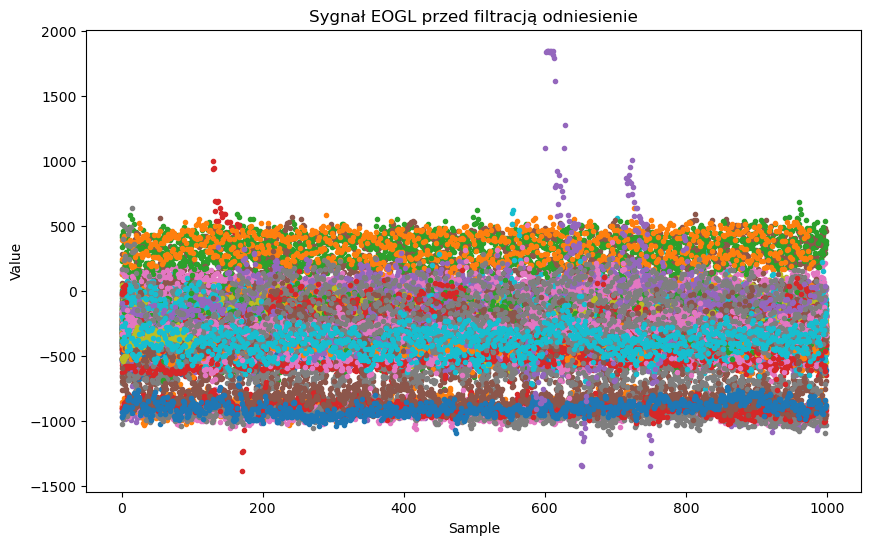

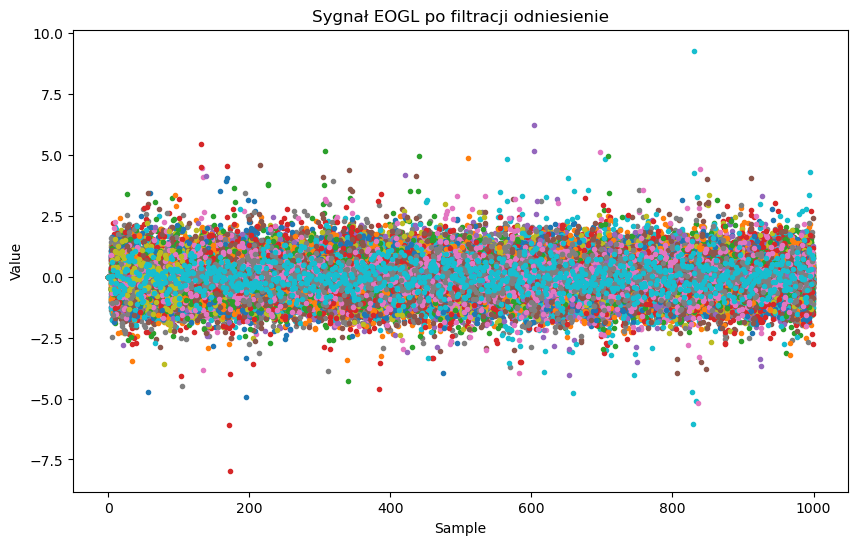

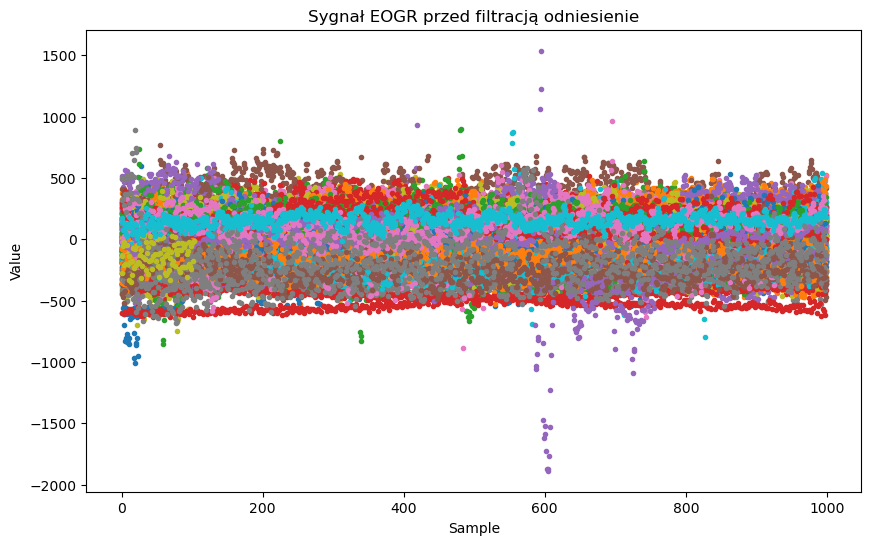

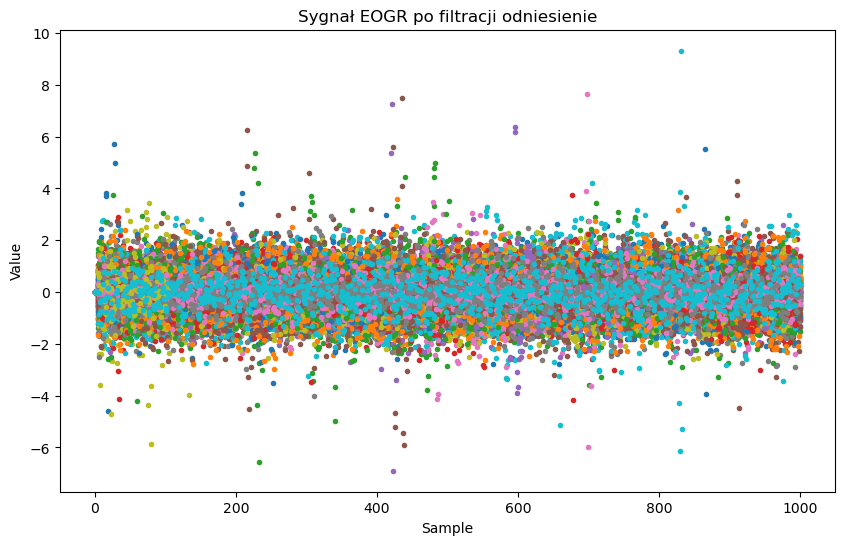

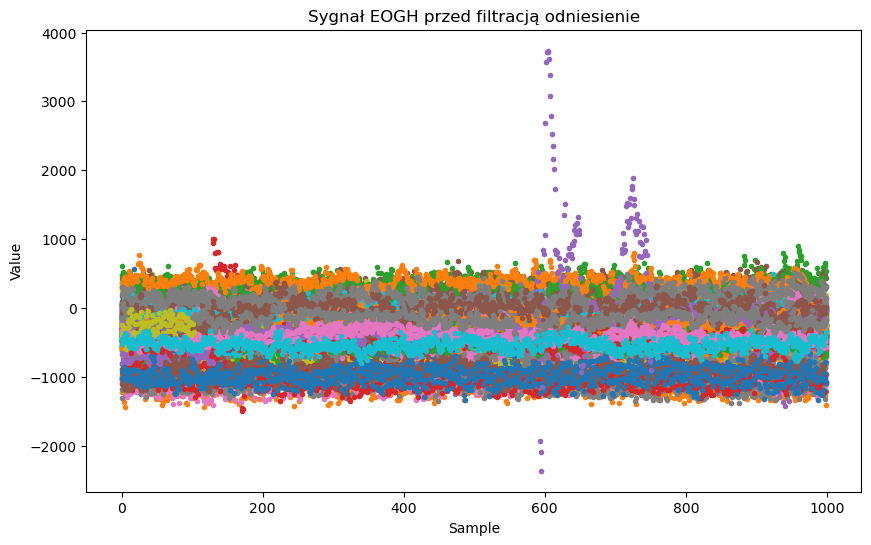

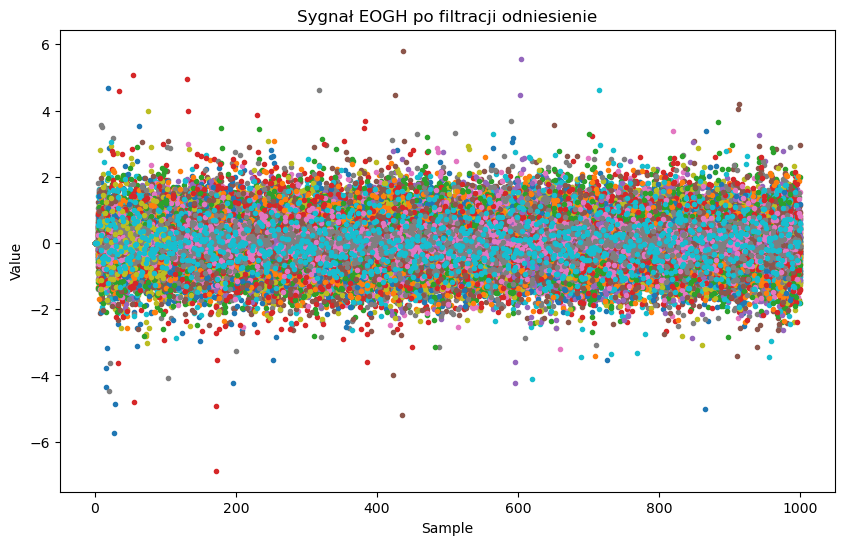

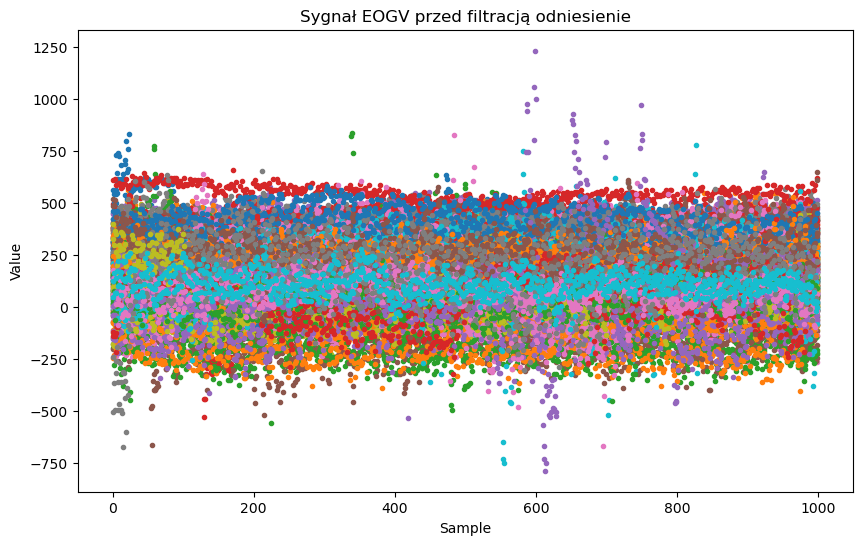

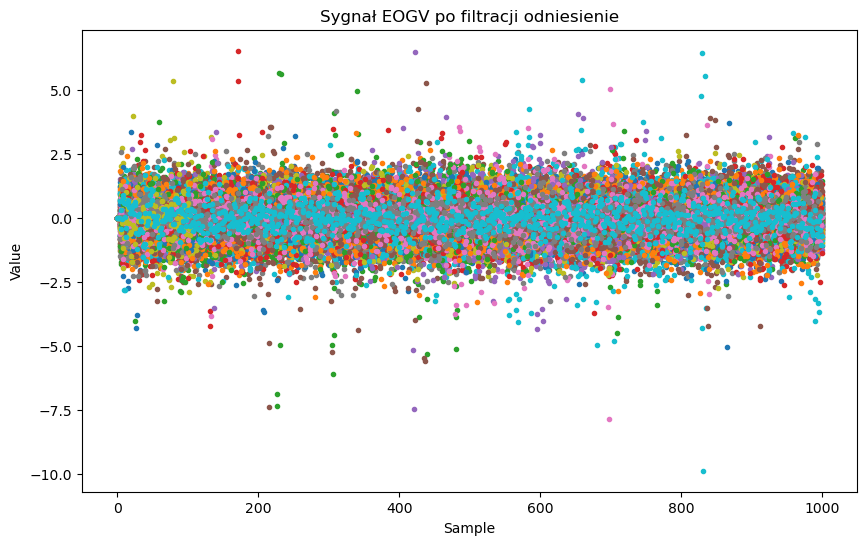

In [51]:
# WYKRESY DLA SYGNAŁU EOG PO FILTRACJI  odniesienie


# Wykresy dla EOGL
plt.figure(figsize=(10, 6))
plt.plot(EOGL_reference, '.')
plt.title('Sygnał EOGL przed filtracją odniesienie')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGL
plt.figure(figsize=(10, 6))
plt.plot(EOGL_filtered_reference, '.')
plt.title('Sygnał EOGL po filtracji odniesienie')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGR
plt.figure(figsize=(10, 6))
plt.plot(EOGR_reference, '.')
plt.title('Sygnał EOGR przed filtracją odniesienie')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGR
plt.figure(figsize=(10, 6))
plt.plot(EOGR_filtered_reference, '.')
plt.title('Sygnał EOGR po filtracji odniesienie')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGH
plt.figure(figsize=(10, 6))
plt.plot(EOGH_reference, '.')
plt.title('Sygnał EOGH przed filtracją odniesienie')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGH
plt.figure(figsize=(10, 6))
plt.plot(EOGH_filtered_reference, '.')
plt.title('Sygnał EOGH po filtracji odniesienie')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGV
plt.figure(figsize=(10, 6))
plt.plot(EOGV_reference, '.')
plt.title('Sygnał EOGV przed filtracją odniesienie')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGV
plt.figure(figsize=(10, 6))
plt.plot(EOGV_filtered_reference, '.')
plt.title('Sygnał EOGV po filtracji odniesienie')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

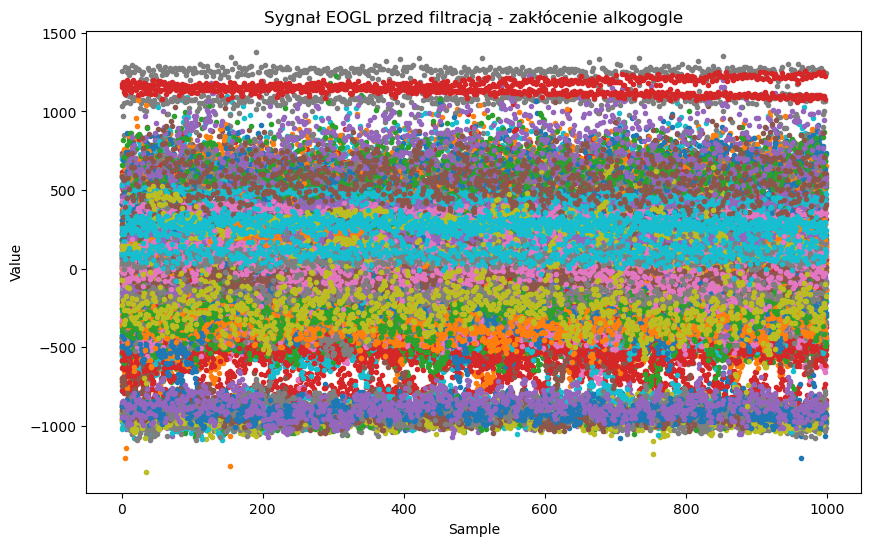

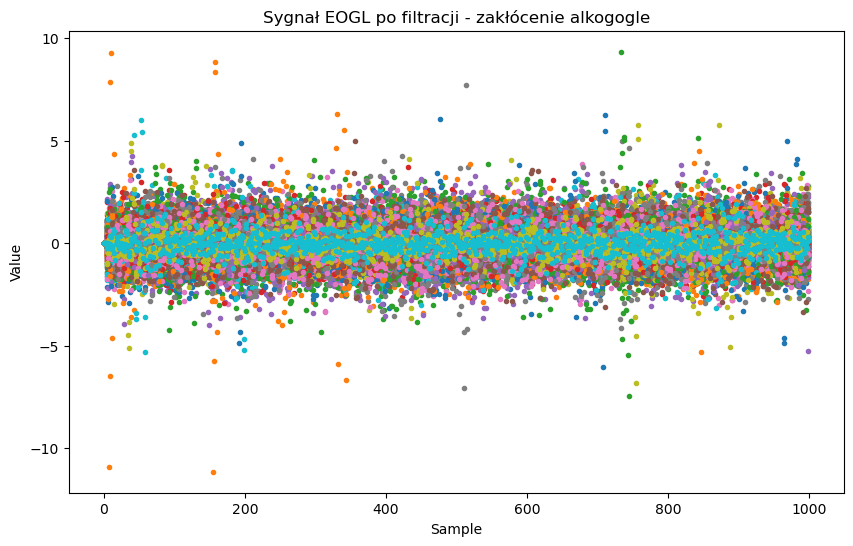

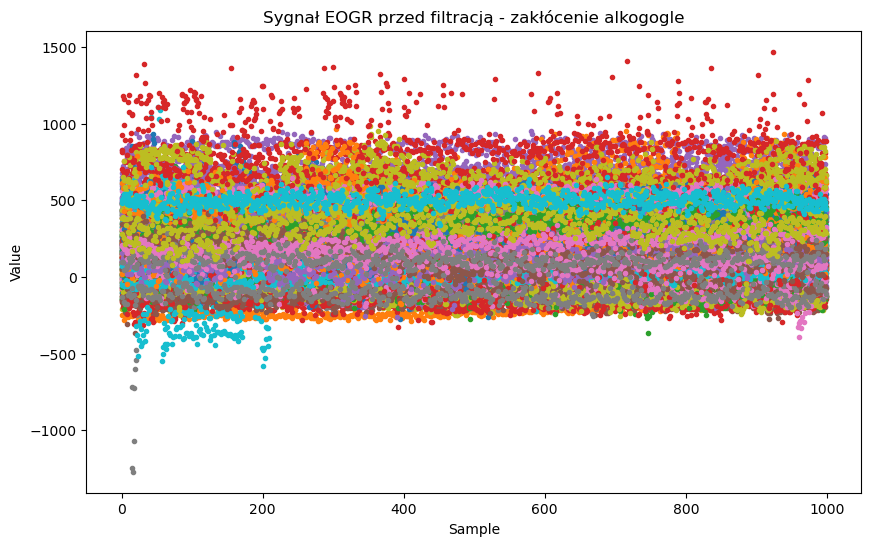

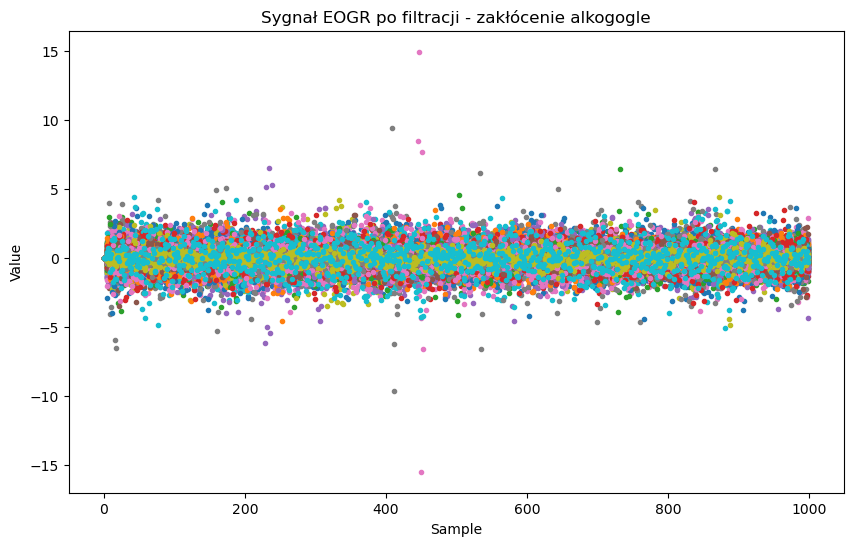

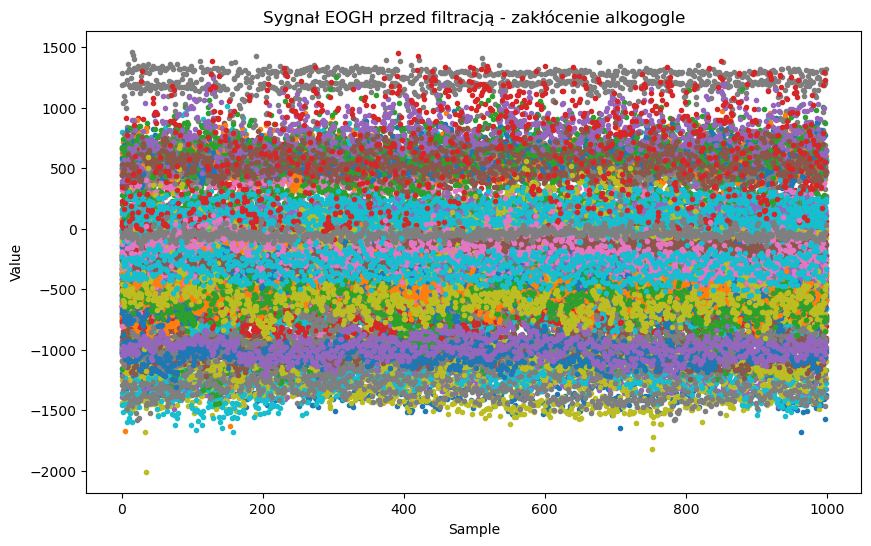

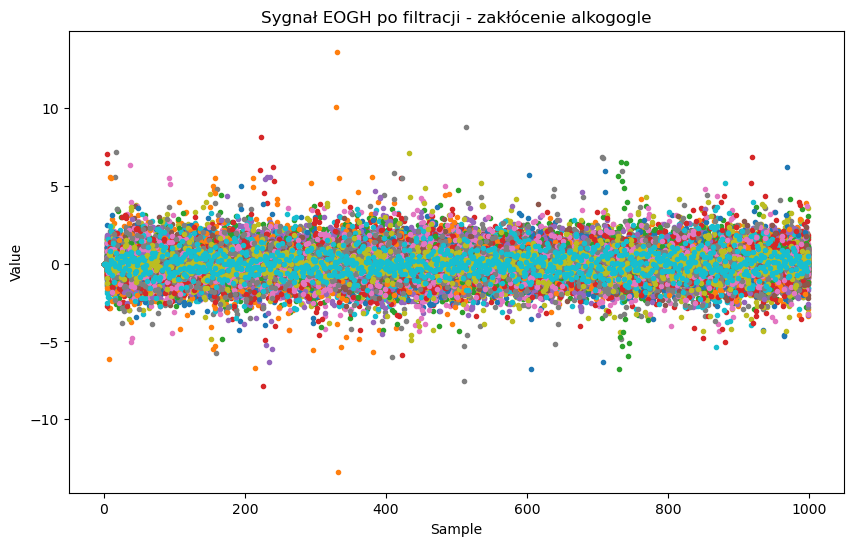

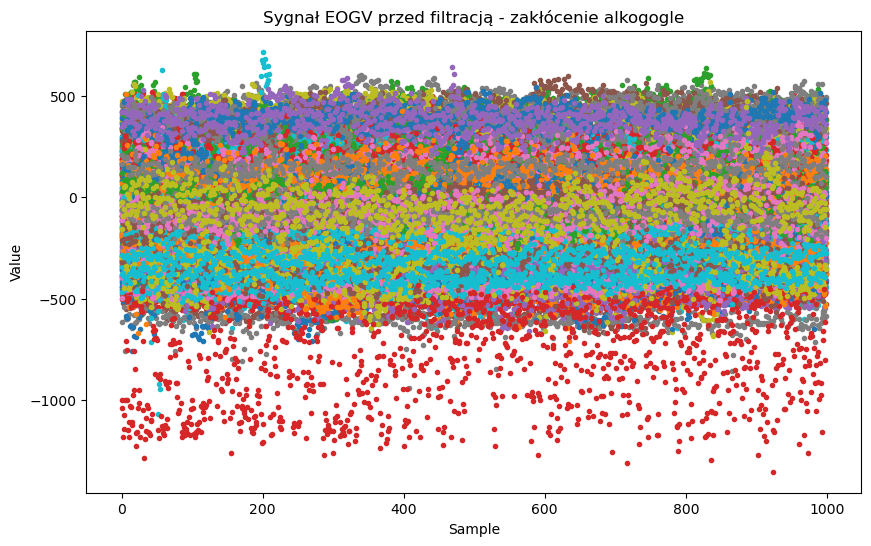

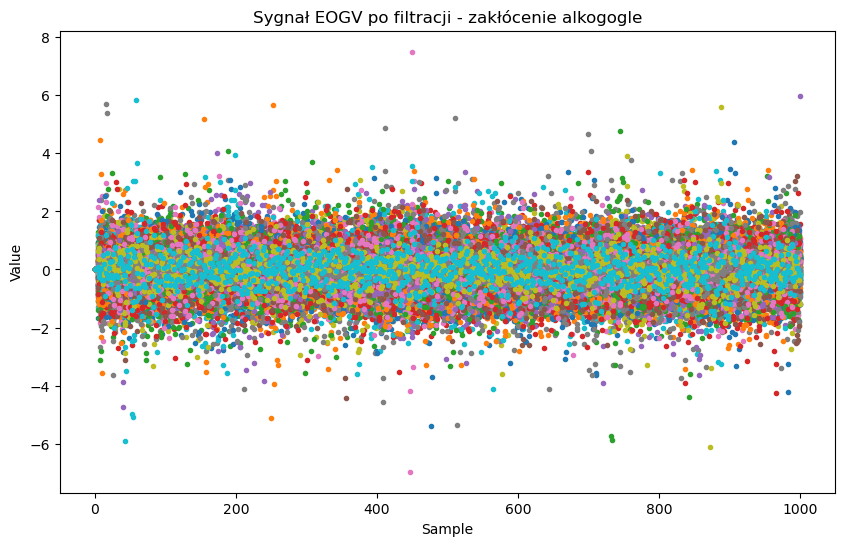

In [49]:
# WYKRESY DLA SYGNAŁU EOG PO FILTRACJI  - zakłócenie alkogogle


# Wykresy dla EOGL
plt.figure(figsize=(10, 6))
plt.plot(EOGL_alcogogle, '.')
plt.title('Sygnał EOGL przed filtracją - zakłócenie alkogogle')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGL
plt.figure(figsize=(10, 6))
plt.plot(EOGL_filtered_alcogogle, '.')
plt.title('Sygnał EOGL po filtracji - zakłócenie alkogogle')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGR
plt.figure(figsize=(10, 6))
plt.plot(EOGR_alcogogle, '.')
plt.title('Sygnał EOGR przed filtracją - zakłócenie alkogogle')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGR
plt.figure(figsize=(10, 6))
plt.plot(EOGR_filtered_alcogogle, '.')
plt.title('Sygnał EOGR po filtracji - zakłócenie alkogogle')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGH
plt.figure(figsize=(10, 6))
plt.plot(EOGH_alcogogle, '.')
plt.title('Sygnał EOGH przed filtracją - zakłócenie alkogogle')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGH
plt.figure(figsize=(10, 6))
plt.plot(EOGH_filtered_alcogogle, '.')
plt.title('Sygnał EOGH po filtracji - zakłócenie alkogogle')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGV
plt.figure(figsize=(10, 6))
plt.plot(EOGV_alcogogle, '.')
plt.title('Sygnał EOGV przed filtracją - zakłócenie alkogogle')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGV
plt.figure(figsize=(10, 6))
plt.plot(EOGV_filtered_alcogogle, '.')
plt.title('Sygnał EOGV po filtracji - zakłócenie alkogogle')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

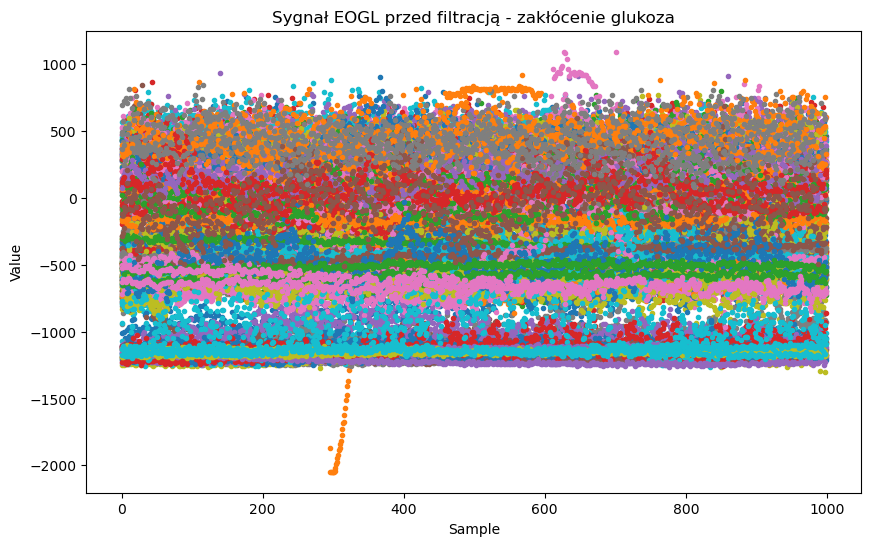

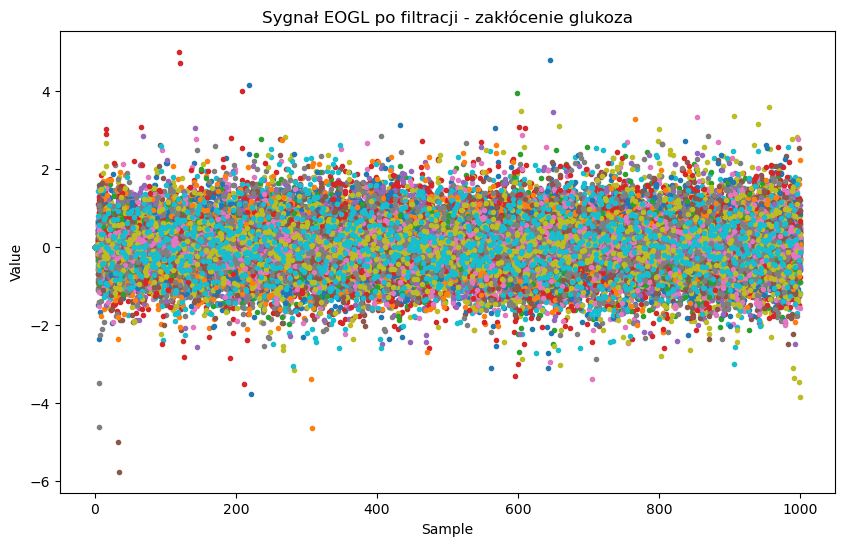

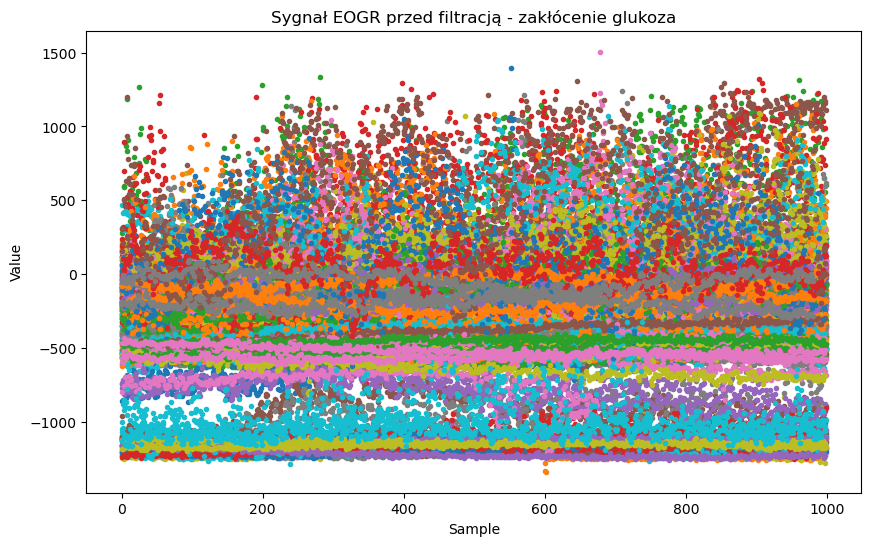

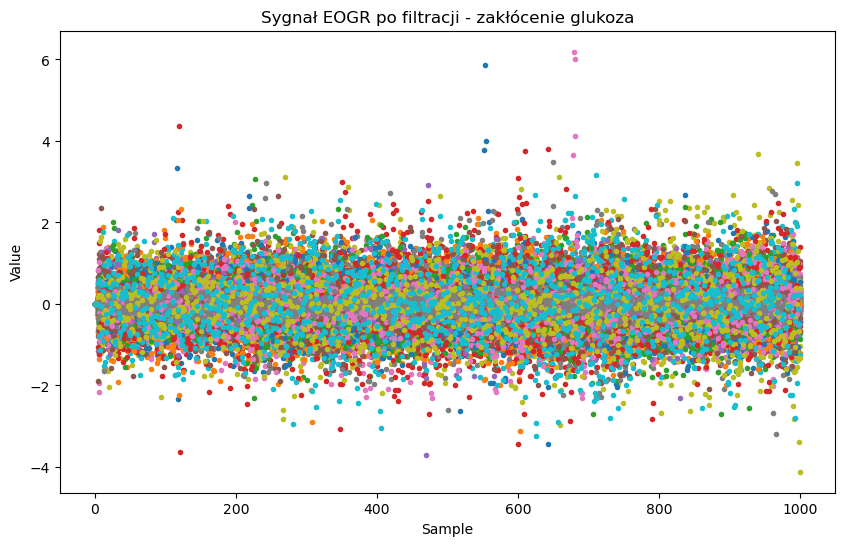

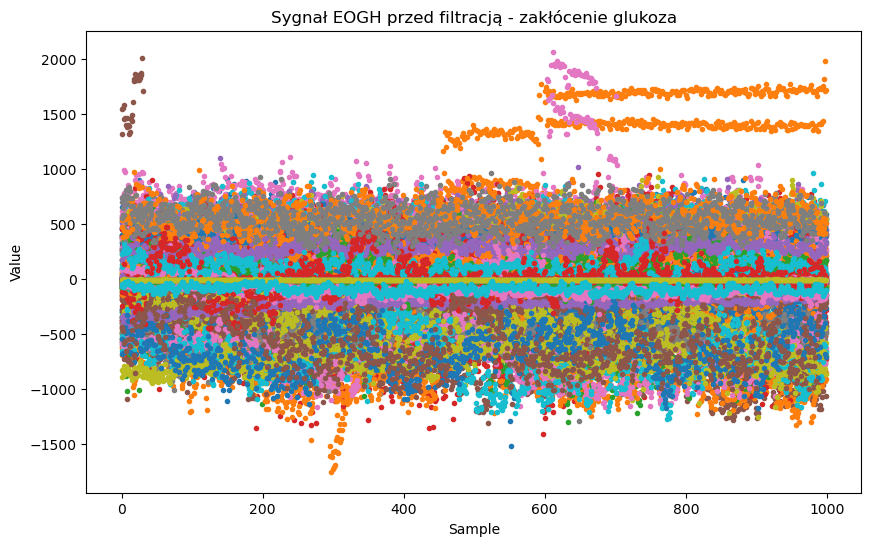

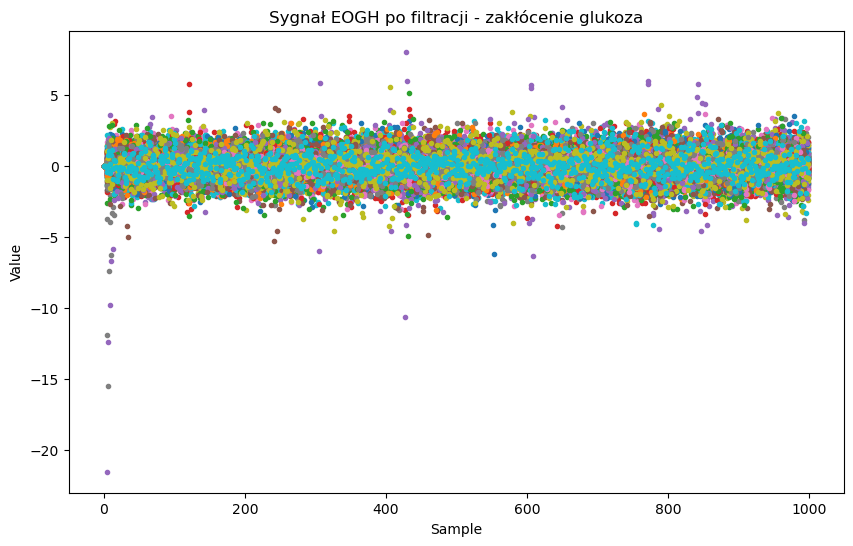

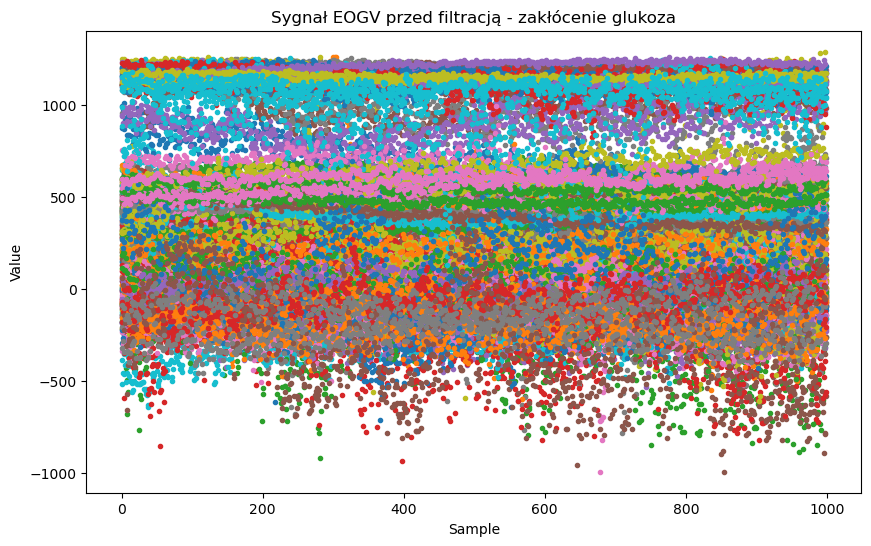

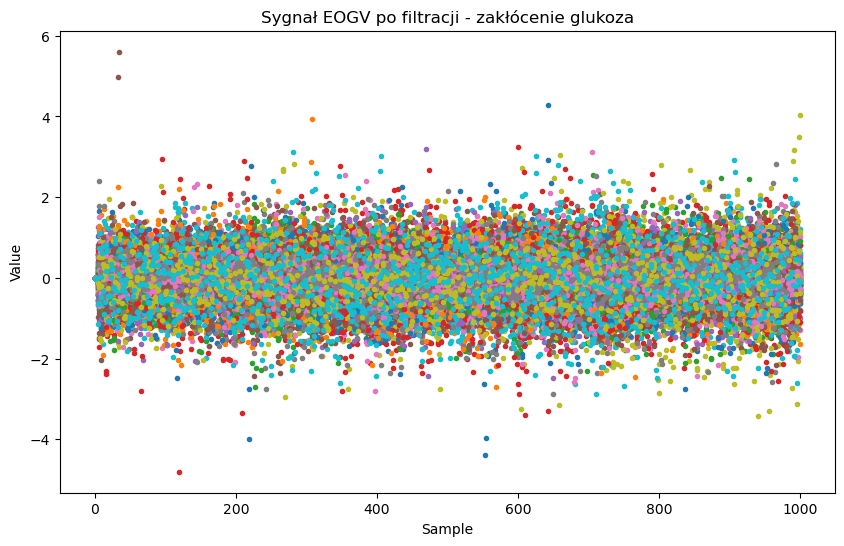

In [48]:
# WYKRESY DLA SYGNAŁU EOG PO FILTRACJI  - zakłócenie glukoza


# Wykresy dla EOGL
plt.figure(figsize=(10, 6))
plt.plot(EOGL_glucose, '.')
plt.title('Sygnał EOGL przed filtracją - zakłócenie glukoza')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGL
plt.figure(figsize=(10, 6))
plt.plot(EOGL_filtered_glucose, '.')
plt.title('Sygnał EOGL po filtracji - zakłócenie glukoza')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGR
plt.figure(figsize=(10, 6))
plt.plot(EOGR_glucose, '.')
plt.title('Sygnał EOGR przed filtracją - zakłócenie glukoza')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGR
plt.figure(figsize=(10, 6))
plt.plot(EOGR_filtered_glucose, '.')
plt.title('Sygnał EOGR po filtracji - zakłócenie glukoza')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGH
plt.figure(figsize=(10, 6))
plt.plot(EOGH_glucose, '.')
plt.title('Sygnał EOGH przed filtracją - zakłócenie glukoza')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGH
plt.figure(figsize=(10, 6))
plt.plot(EOGH_filtered_glucose, '.')
plt.title('Sygnał EOGH po filtracji - zakłócenie glukoza')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGV
plt.figure(figsize=(10, 6))
plt.plot(EOGV_glucose, '.')
plt.title('Sygnał EOGV przed filtracją - zakłócenie glukoza')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGV
plt.figure(figsize=(10, 6))
plt.plot(EOGV_filtered_glucose, '.')
plt.title('Sygnał EOGV po filtracji - zakłócenie glukoza')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

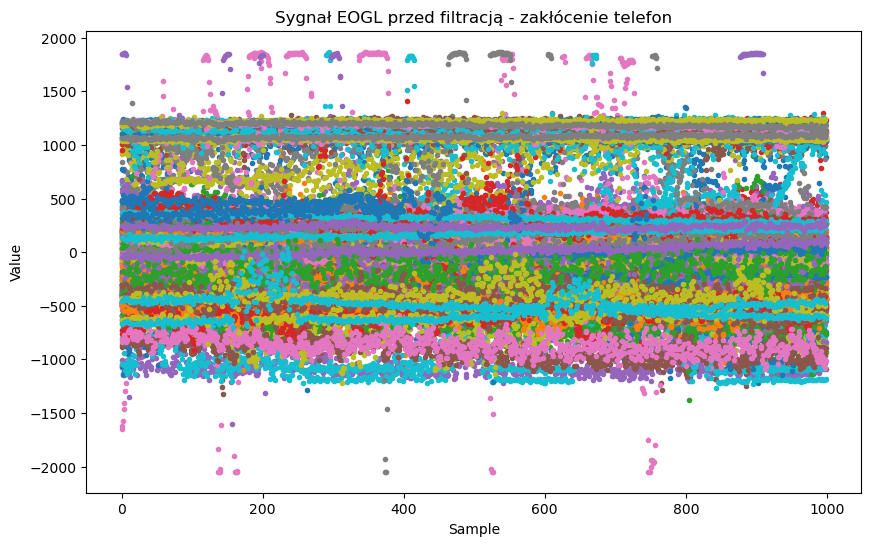

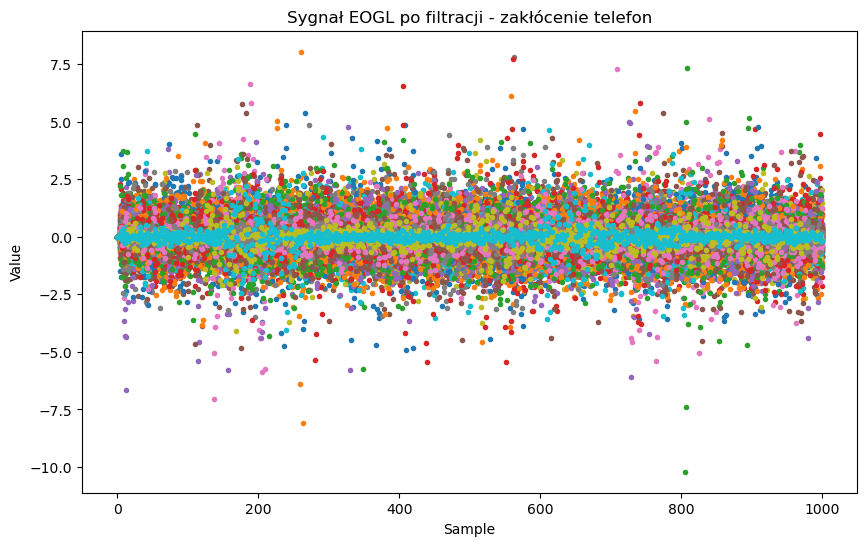

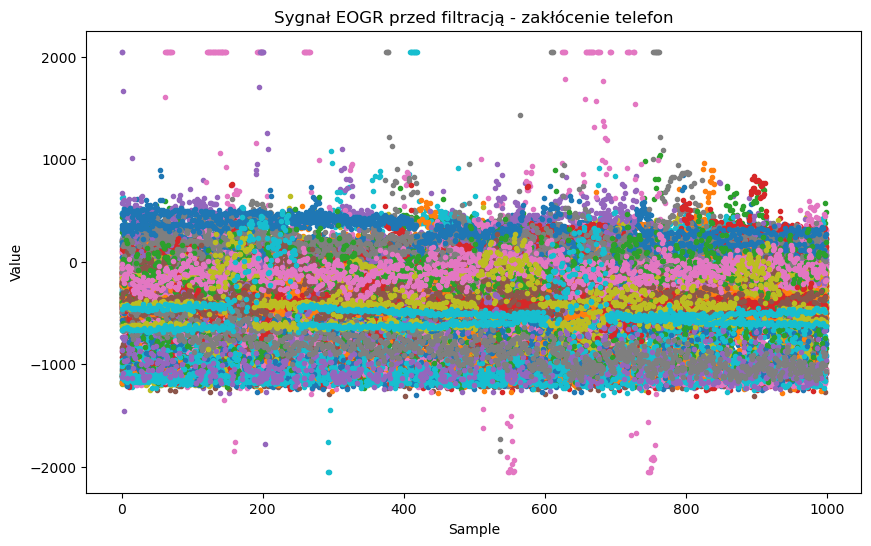

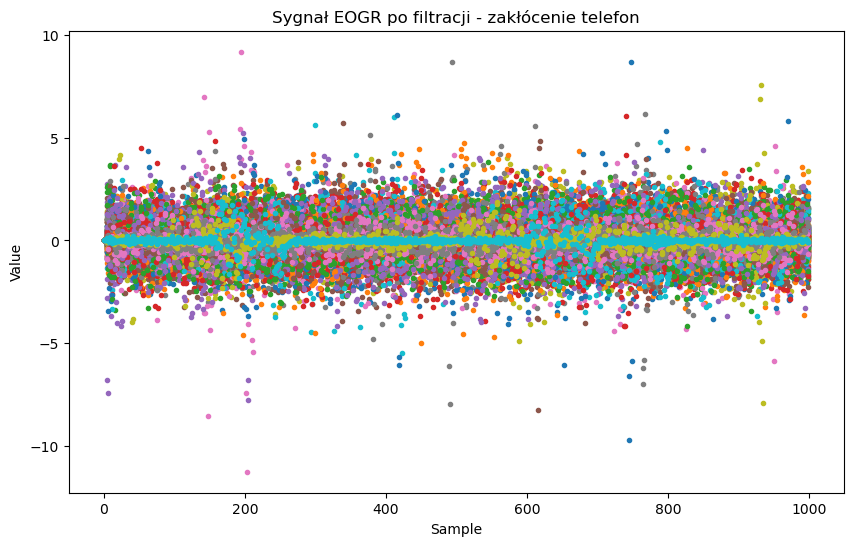

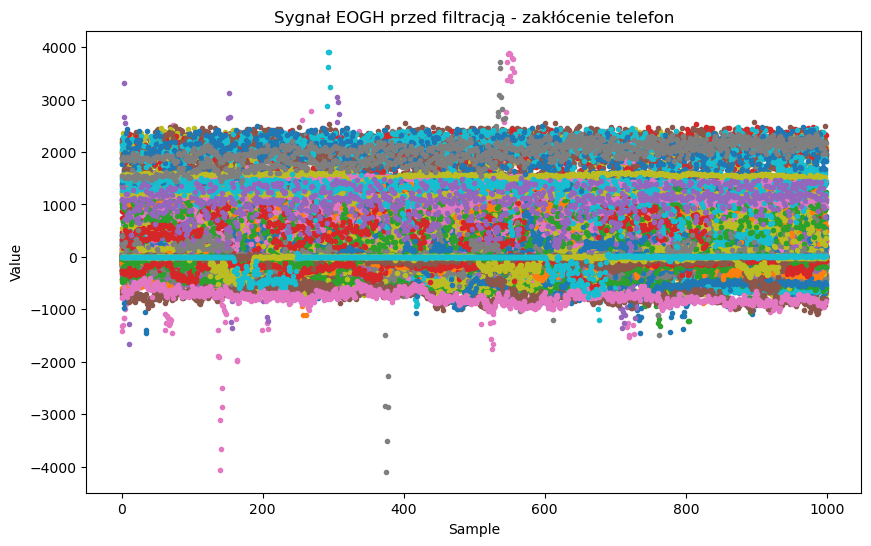

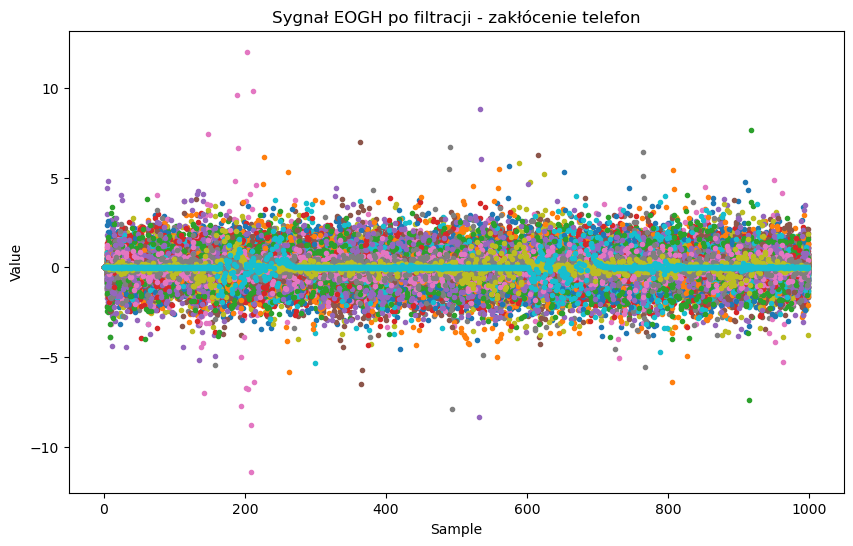

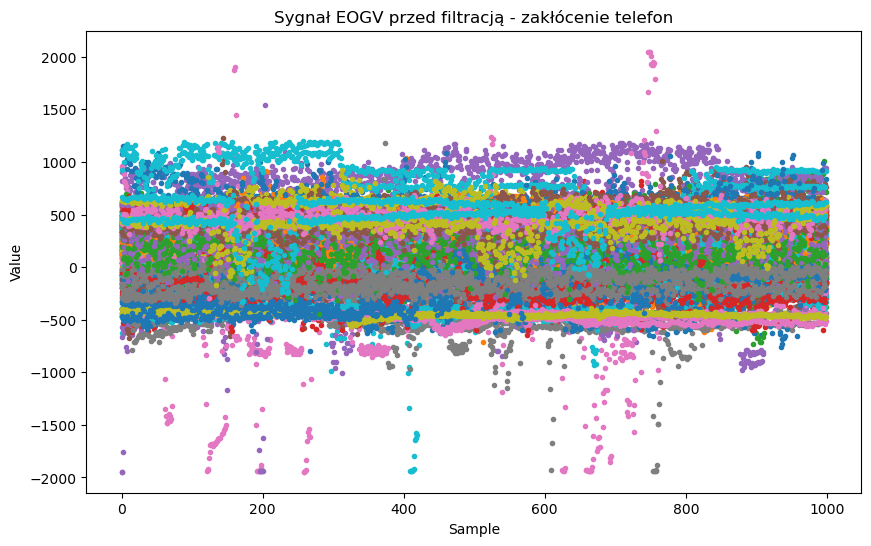

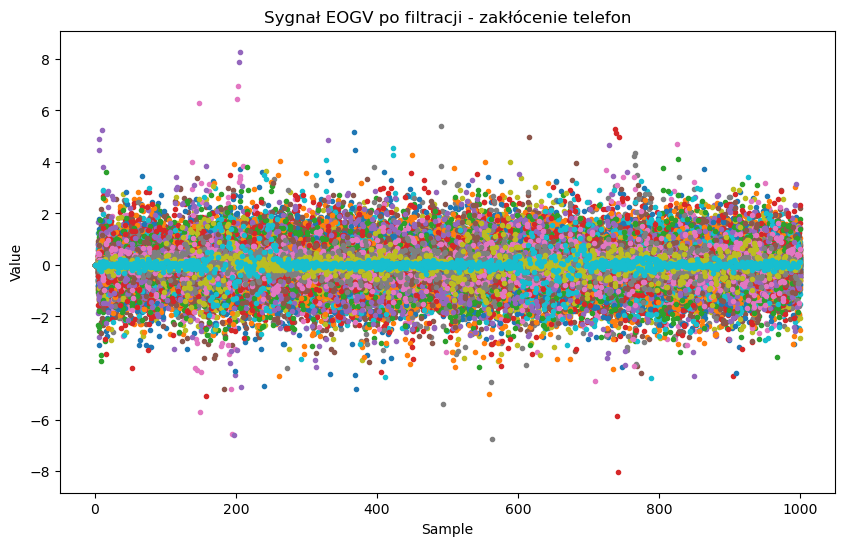

In [50]:
# WYKRESY DLA SYGNAŁU EOG PO FILTRACJI  - zakłócenie telefon


# Wykresy dla EOGL
plt.figure(figsize=(10, 6))
plt.plot(EOGL_phone, '.')
plt.title('Sygnał EOGL przed filtracją - zakłócenie telefon')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGL
plt.figure(figsize=(10, 6))
plt.plot(EOGL_filtered_phone, '.')
plt.title('Sygnał EOGL po filtracji - zakłócenie telefon')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGR
plt.figure(figsize=(10, 6))
plt.plot(EOGR_phone, '.')
plt.title('Sygnał EOGR przed filtracją - zakłócenie telefon')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGR
plt.figure(figsize=(10, 6))
plt.plot(EOGR_filtered_phone, '.')
plt.title('Sygnał EOGR po filtracji - zakłócenie telefon')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGH
plt.figure(figsize=(10, 6))
plt.plot(EOGH_phone, '.')
plt.title('Sygnał EOGH przed filtracją - zakłócenie telefon')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGH
plt.figure(figsize=(10, 6))
plt.plot(EOGH_filtered_phone, '.')
plt.title('Sygnał EOGH po filtracji - zakłócenie telefon')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGV
plt.figure(figsize=(10, 6))
plt.plot(EOGV_phone, '.')
plt.title('Sygnał EOGV przed filtracją - zakłócenie telefon')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGV
plt.figure(figsize=(10, 6))
plt.plot(EOGV_filtered_phone, '.')
plt.title('Sygnał EOGV po filtracji - zakłócenie telefon')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

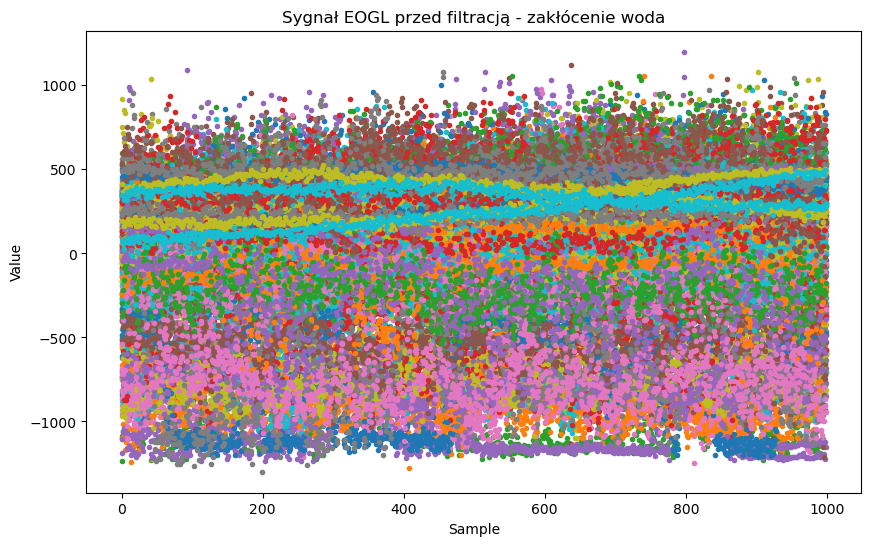

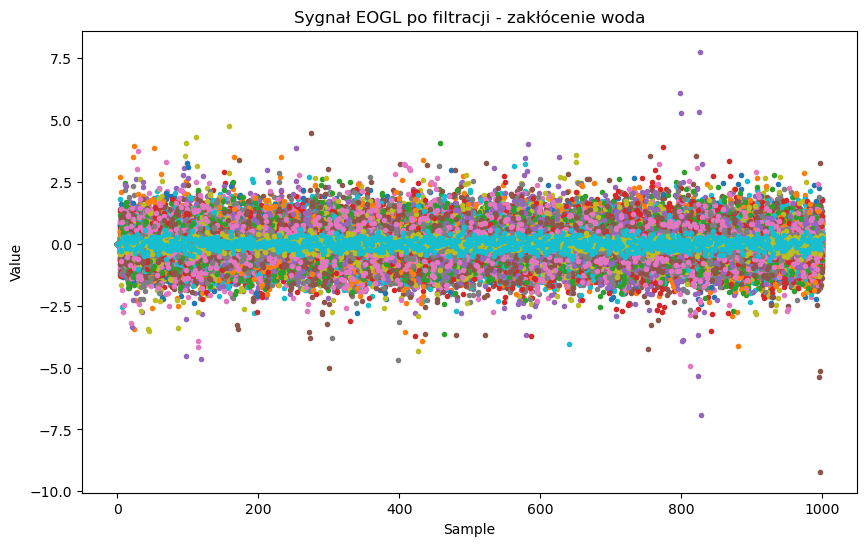

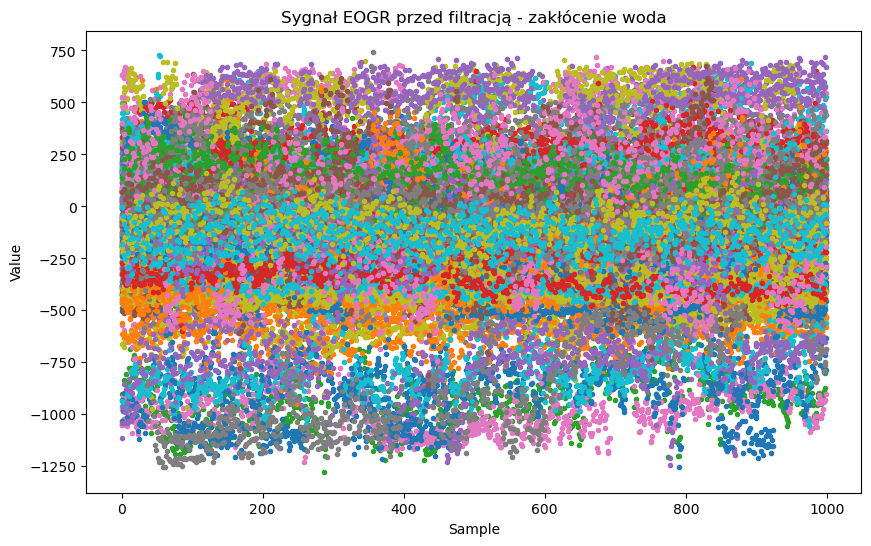

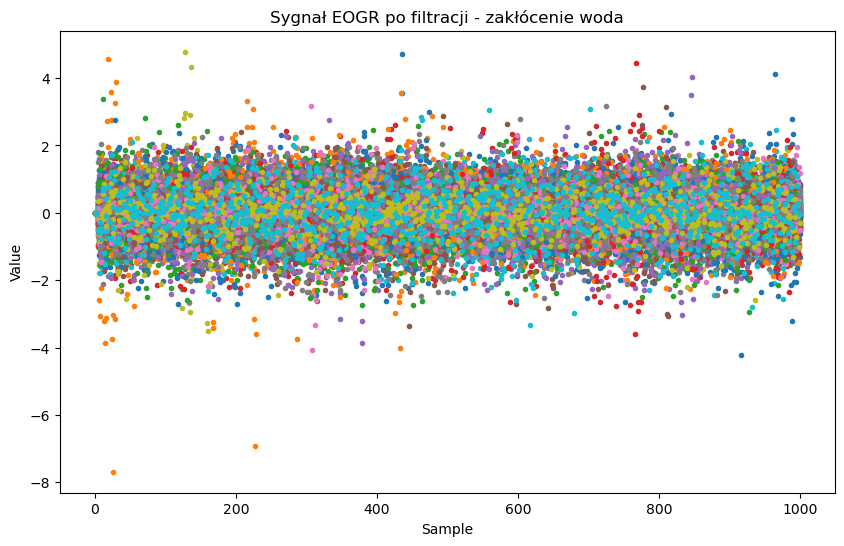

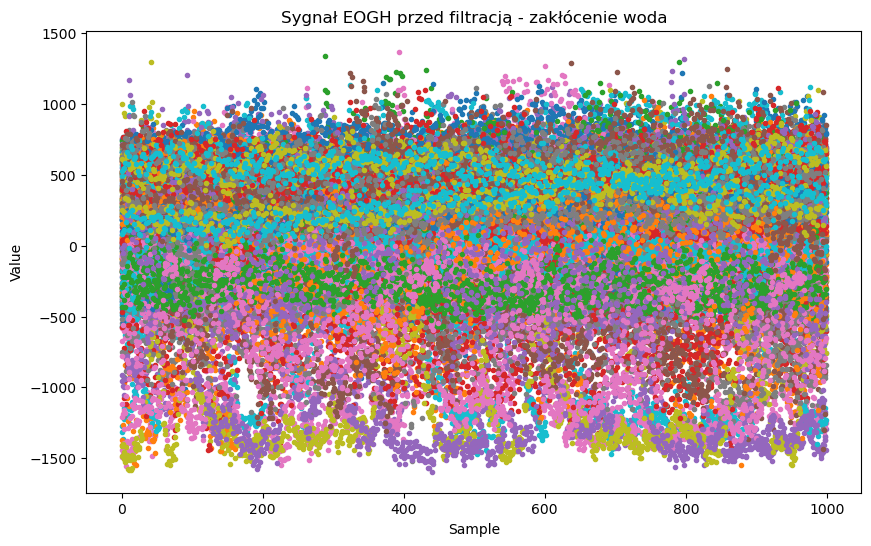

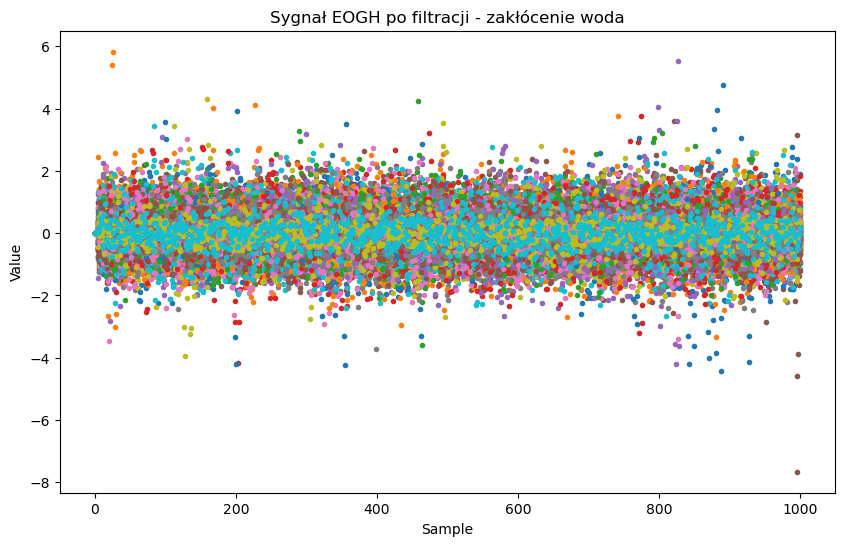

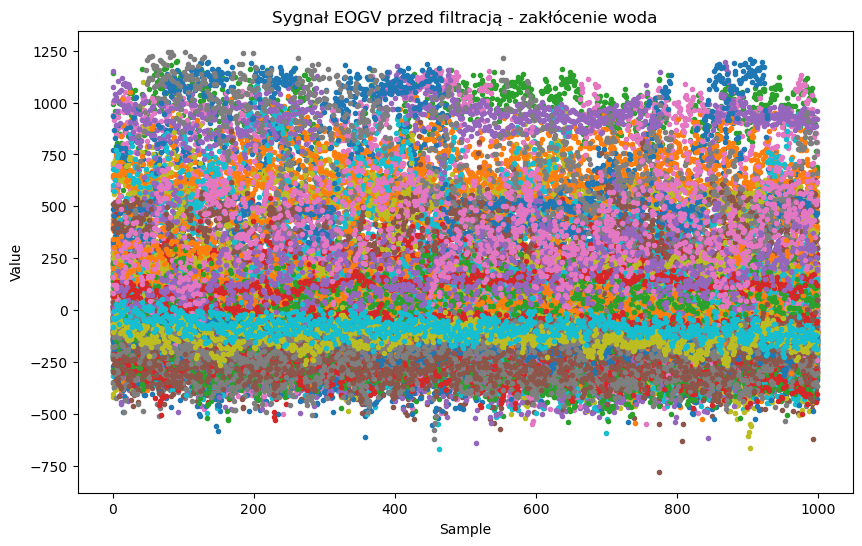

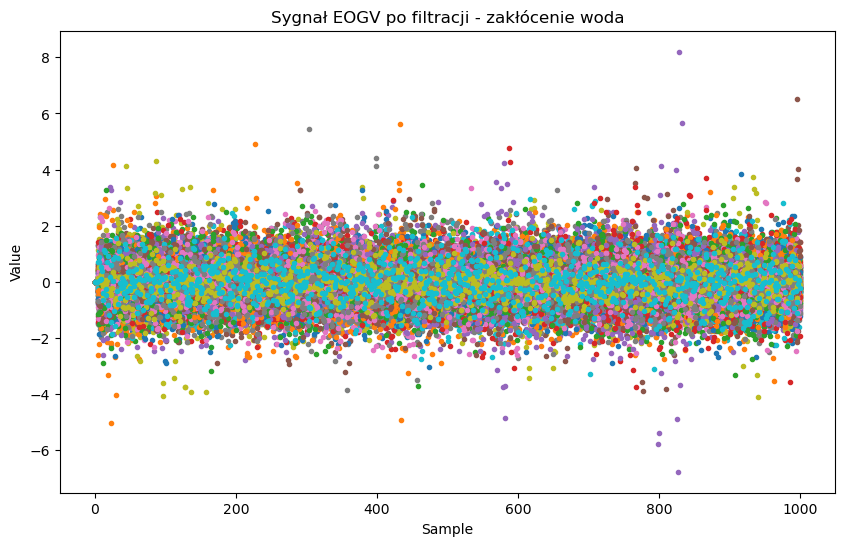

In [47]:
# WYKRESY DLA SYGNAŁU EOG PO FILTRACJI  - zakłócenie woda

import matplotlib.pyplot as plt

# Wykresy dla EOGL
plt.figure(figsize=(10, 6))
plt.plot(EOGL_water, '.')
plt.title('Sygnał EOGL przed filtracją - zakłócenie woda')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGL
plt.figure(figsize=(10, 6))
plt.plot(EOGL_filtered_water, '.')
plt.title('Sygnał EOGL po filtracji - zakłócenie woda')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGR
plt.figure(figsize=(10, 6))
plt.plot(EOGR_water, '.')
plt.title('Sygnał EOGR przed filtracją - zakłócenie woda')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGR
plt.figure(figsize=(10, 6))
plt.plot(EOGR_filtered_water, '.')
plt.title('Sygnał EOGR po filtracji - zakłócenie woda')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGH
plt.figure(figsize=(10, 6))
plt.plot(EOGH_water, '.')
plt.title('Sygnał EOGH przed filtracją - zakłócenie woda')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGH
plt.figure(figsize=(10, 6))
plt.plot(EOGH_filtered_water, '.')
plt.title('Sygnał EOGH po filtracji - zakłócenie woda')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGV
plt.figure(figsize=(10, 6))
plt.plot(EOGV_water, '.')
plt.title('Sygnał EOGV przed filtracją - zakłócenie woda')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()

# Wykresy dla EOGV
plt.figure(figsize=(10, 6))
plt.plot(EOGV_filtered_water, '.')
plt.title('Sygnał EOGV po filtracji - zakłócenie woda')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.show()